C:\Users\sereege\AppData\Local\Temp/ipykernel_6392/680476772.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_15 = dataset_per_region[dataset_per_region["topic"] == i][dataset_per_region["region"] == j].sort_values("result for region", ascending = False).head(15)
G:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


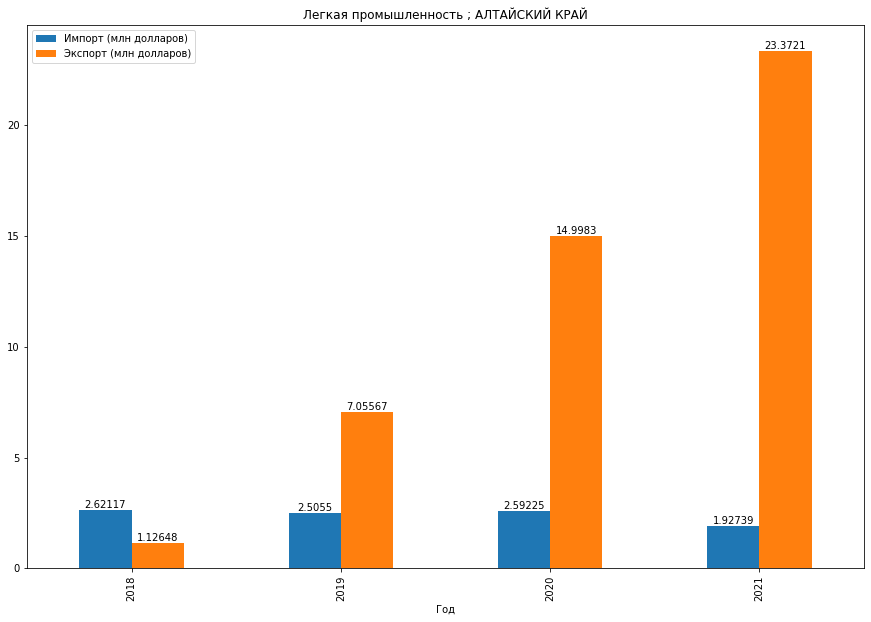

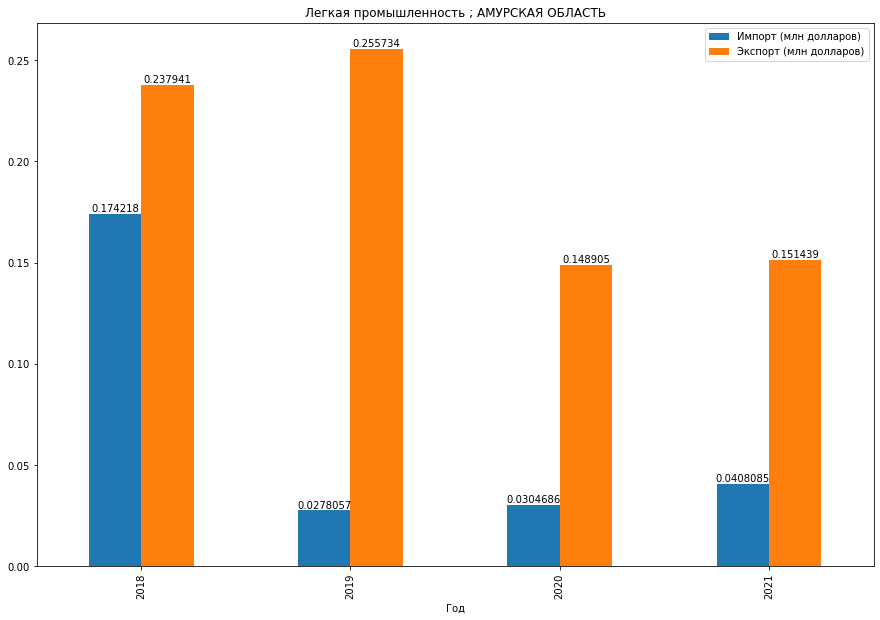

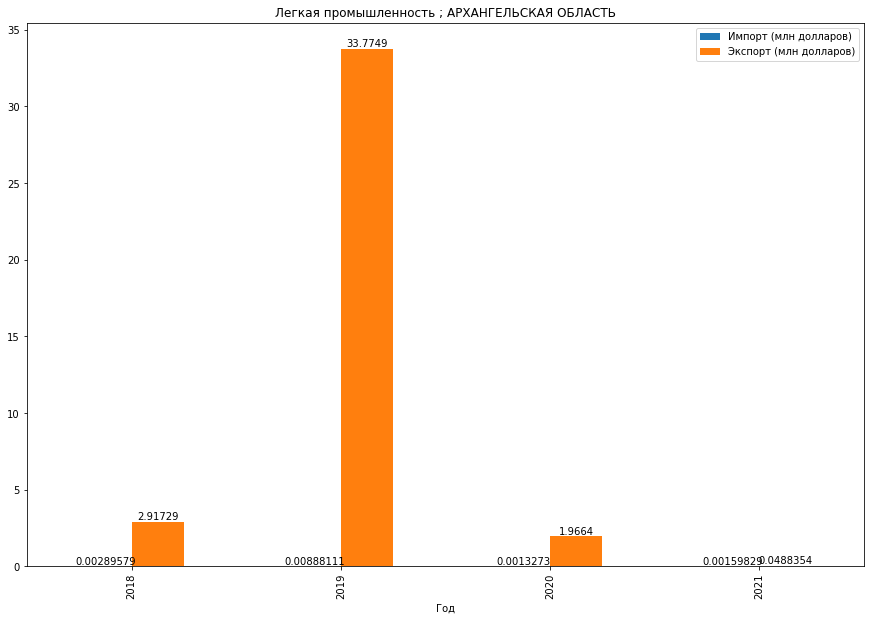

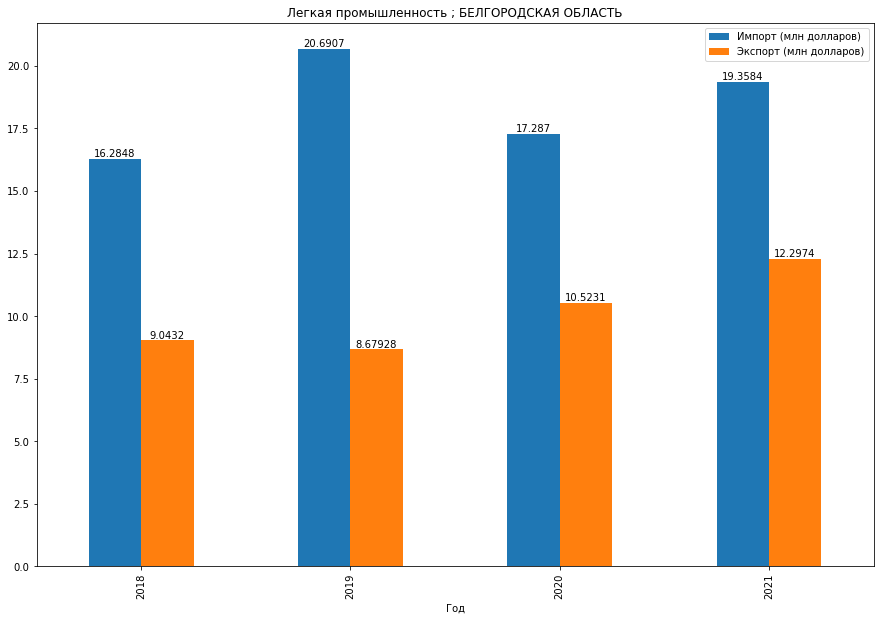

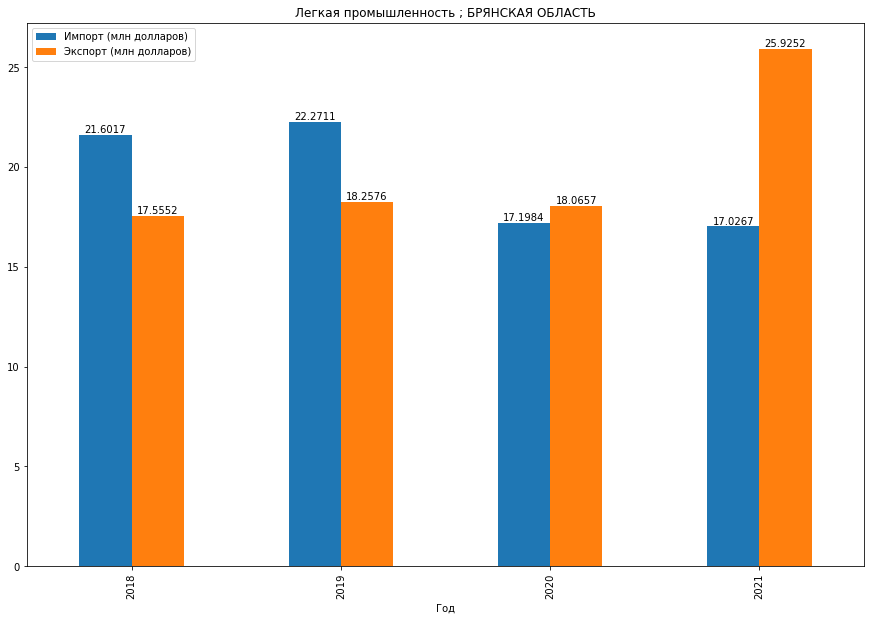

...

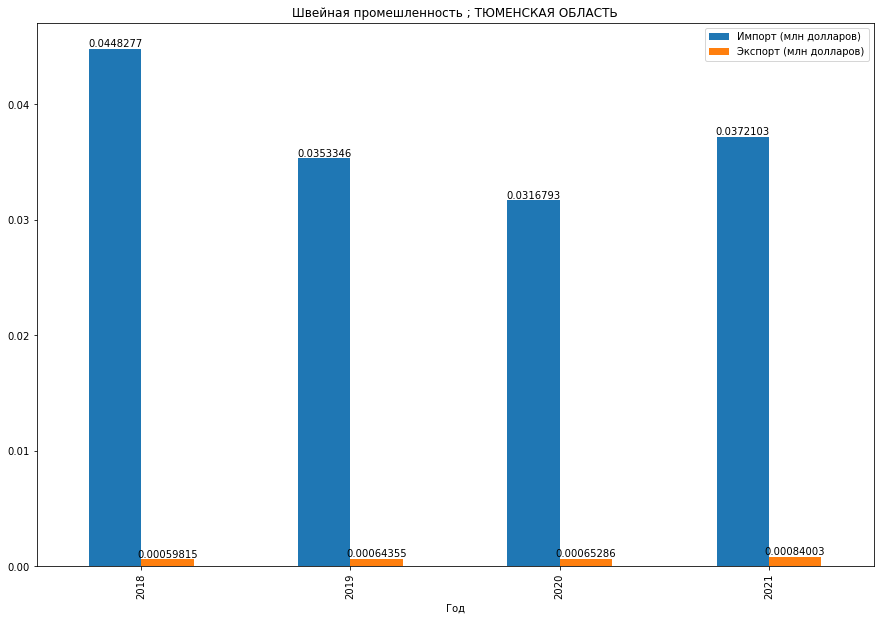

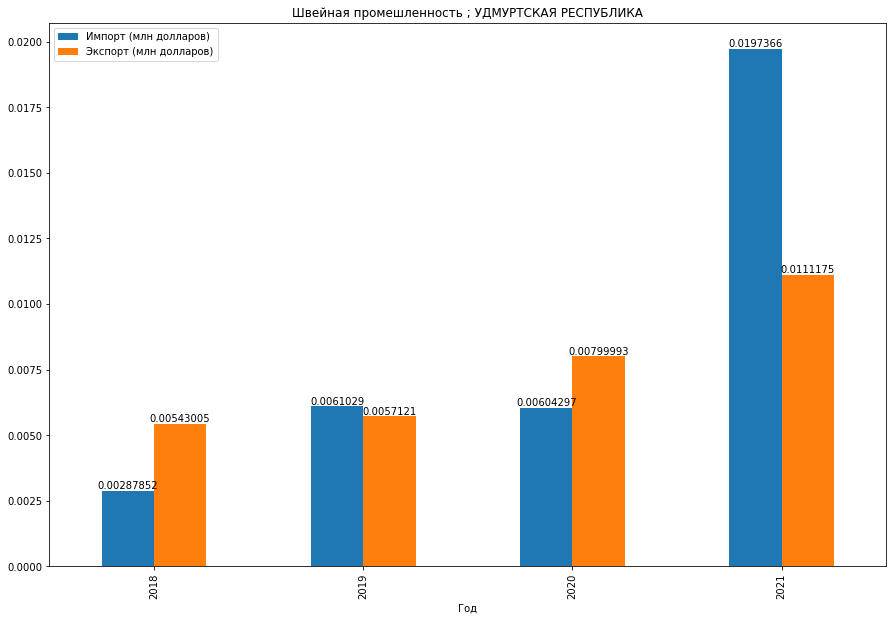

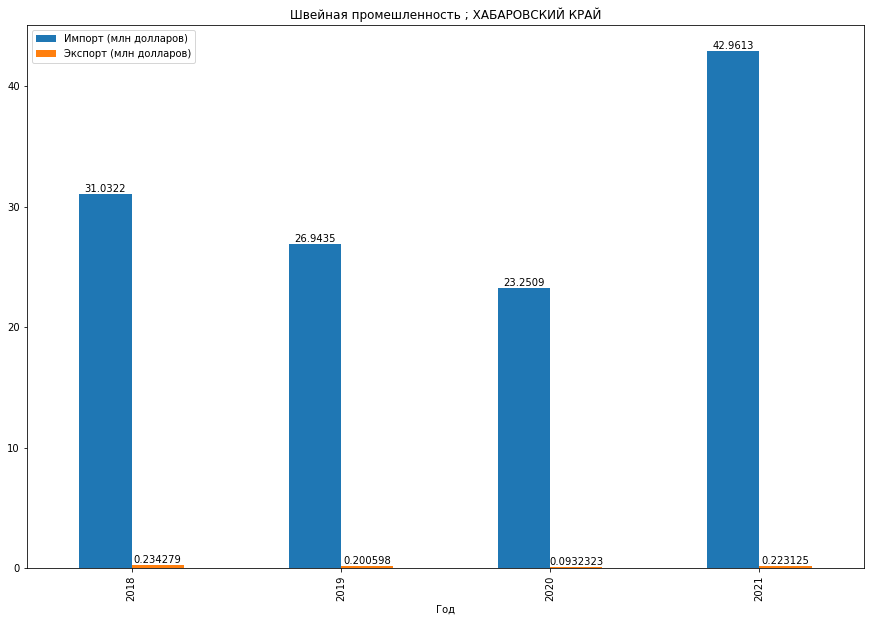

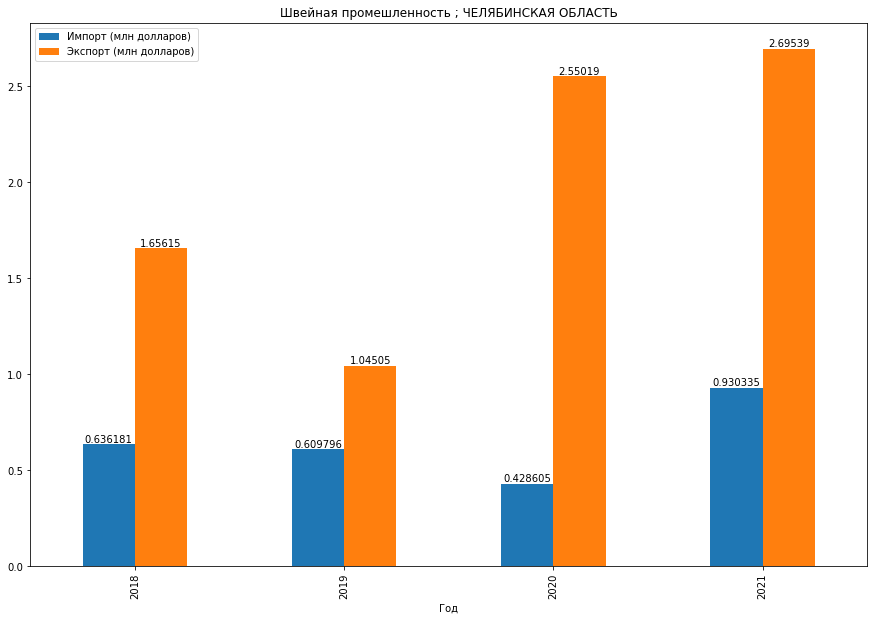

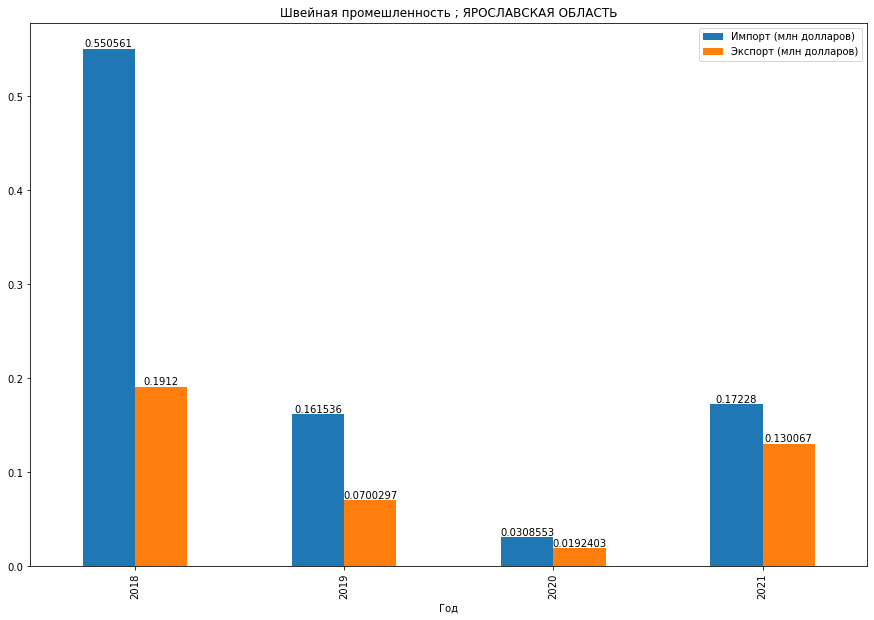

In [72]:
def create_all_datasets():
    import swifter
    import pandas as pd
    end_year = 2022
    avg_dollar = {2018: 62.7091, 2019: 64.7362, 2020: 72.1464, 2021: 73.6541}
    weight_important = 1.5

    # =Считываем все данные от Таможенной службы=

    dataset = pd.read_csv('data.csv', delimiter = ';')[["code", "region", "value", "month", "direction"]]

    # =Считываем расшифровку кодов ТНВЭД=

    path='TNVED.csv'
    TNVED = pd.read_csv(path, sep = '\\t', engine='python')

    # =Считываем и обрабатываем список важнейших товаров=

    path="Импорт_важнейших_товаров.xlsx"
    important_goods = pd.read_excel(path, header = 15)
    important_goods=important_goods.loc[4:]
    def in_list(k, list1):
        '''
        Функция проверяет есть ли код в списке
        k - искомый код ТНВЭД
        list1 - список с кодами ТНВЭД(могут иметь произвольную длину а также вид 1100-1200)
        '''
        def is_need(x, index):
            '''
            Функция проверяет подходит ли код ТНВЭД в интервал или равен ли он другому коду
            x - искомый код ТНВЭД
            index - код с которым сверяемся или интервал вида 1100-1200 попадение в который проверяется
            '''
            if "-" not in str(index):
                return str(x)[:len(str(index))] == str(index)
            else:
                return str(x)[:str(index).index('-')] <= str(index).split("-")[1] and str(x)[:str(index).index('-')] >= str(index).split("-")[0]
        return int(max(list(map(lambda y: is_need(k, y), list1))))



    # =Считываем и обрабатываем информацию про внутреннее производство товаров=

    path="otgruz_god.xlsx"
    otgruz_good = pd.read_excel(path, 1, header = 3)
    otgruz_good = otgruz_good[[x == x for x in otgruz_good['tnved']]]

        # =Обрабатываем случай при котором одному типу производства соответсвует несколько ТНВЭД=

    otgruz_good_many_tnved = otgruz_good[list(map(lambda x: str(x).find(" ") not in [0, len(str(x)) - 1, -1], otgruz_good['tnved']))]
    otgruz_good_one_tnved = otgruz_good[list(map(lambda x: str(x).find(" ") in [0, len(str(x)) - 1, -1], otgruz_good['tnved']))]
    list_flatten_many_tnved = []
    from copy import deepcopy
    for row in otgruz_good_many_tnved.reset_index().to_dict('records'):
        row["tnved"] = row["tnved"].split()
        for one_tnved in row["tnved"]:
            row_copy = deepcopy(row)
            row_copy["tnved"] = one_tnved
            list_flatten_many_tnved.append(row_copy)
    otgruz_good = otgruz_good_one_tnved.append(pd.DataFrame(list_flatten_many_tnved))

        # =Меняем названия, единицы измерения и группируем по кодам ТНВЭД=

    otgruz_good = otgruz_good.rename(lambda x: str(x).strip(), axis='columns')
    agg_func = {str(x) : "sum" for x in range(2018, end_year)}
    otgruz_good = otgruz_good.groupby(['tnved']).agg(agg_func).reset_index()
    otgruz_good = otgruz_good.rename(lambda x: x + " money" if x != "tnved" else x, axis='columns')
    for i in range(2018, end_year):
        otgruz_good[str(i) + " money"] = otgruz_good[str(i) + " money"].apply(lambda x: x * (10 ** 6) / avg_dollar[i])

        # =Добавляем идекс роста производства=

    for i in range(2019, end_year):
        otgruz_good[str(i) + " index"] = otgruz_good[str(i) + " money"] / otgruz_good[str(i - 1) + " money"]

    # =Считываем и обрабатываем коэффициенты Херфиндаля-Хиршмана=

    path="Koef_konc_H-H.xlsx"
    list_data_koef_X_X = []
    for itera in [str(x) for x in range(2018, end_year)]:

        # =Считываем, очищаем и объединяем коэффициенты за год=

        data_1_koef_X_X = pd.read_excel(path, 3*int(itera) - (3*2018 - 1), header = 4)
        data_2_koef_X_X = pd.read_excel(path, 3*int(itera) - (3*2018 - 2), header = 4)
        data_3_koef_X_X = pd.read_excel(path, 3*int(itera) - (3*2018 - 3), header = 4)
        data_koef_X_X = pd.concat([data_1_koef_X_X, data_2_koef_X_X, data_3_koef_X_X])
        data_koef_X_X = data_koef_X_X[["Unnamed: 12", "Unnamed: 13"]]
        data_koef_X_X = data_koef_X_X.rename(columns = {"Unnamed: 12" : itera + " koef X-X", "Unnamed: 13" : "tnved"})
        data_koef_X_X = data_koef_X_X[[x == x for x in data_koef_X_X['tnved']]]

        # =Обрабатываем случай при котором одному типу производства соответсвует несколько ТНВЭД=

        data_koef_X_X_many_tnved = data_koef_X_X[list(map(lambda x: str(x).find(" ") not in [0, len(str(x)) - 1, -1], data_koef_X_X['tnved']))]
        data_koef_X_X_one_tnved = data_koef_X_X[list(map(lambda x: str(x).find(" ") in [0, len(str(x)) - 1, -1], data_koef_X_X['tnved']))]
        list_flatten_many_tnved = []
        from copy import deepcopy
        for row in data_koef_X_X_many_tnved.reset_index().to_dict('records'):
            row["tnved"] = row["tnved"].split()
            for one_tnved in row["tnved"]:
                row_copy = deepcopy(row)
                row_copy["tnved"] = one_tnved
                list_flatten_many_tnved.append(row_copy)
        data_koef_X_X = data_koef_X_X_one_tnved.append(pd.DataFrame(list_flatten_many_tnved))
        data_koef_X_X = data_koef_X_X[list(filter(lambda x: x != "index", list(data_koef_X_X.columns)))]
        # =Группируем по кодам ТНВЭД и объединемя в один датасет
        data_koef_X_X = data_koef_X_X.groupby(['tnved']).agg('mean').reset_index()
        list_data_koef_X_X.append(data_koef_X_X)
    full_data_koef_X_X = list_data_koef_X_X[0]
    for data_koef_X_X in list_data_koef_X_X[1:]:
        full_data_koef_X_X = full_data_koef_X_X.merge(data_koef_X_X, on = "tnved")

    # =Считываем и обрабатываем информацию про международную торговлю=

    path = "Trade_Map_List_of_exported_products_for_the_selected_product_All.csv"
    world_trade = pd.read_csv(path, header = 8)
    dict_to_rename = dict(list(map(lambda x: (x, x[x.rfind("in") + 3:] + " world trade"),list(filter(lambda x: "Share" in x,list(world_trade.columns))))))
    dict_to_rename = dict_to_rename | {"Product code" : "tnved"}
    world_trade = world_trade.rename(columns = dict_to_rename)
    world_trade["tnved"] = world_trade["tnved"].apply(lambda x: x.replace('\'', ''))
    world_trade = world_trade.loc[:, world_trade.columns != "2017"]
    for i in range(2018, end_year):
        world_trade[str(i) + " world trade"] = world_trade[str(i) + " world trade"].apply(lambda x: x if x != 0.0 else 0.01)
    world_trade = world_trade.loc[:, world_trade.columns != "Product label"]

    # =Считываем и обрабатываем разбиение товаров по отраслям производства=

    path = "Темы.xlsx"
    topics = pd.read_excel(path)
    topics = topics.rename(columns = {i: i.replace("\n", "") for i in topics.columns})
    for i in topics.columns:
        topics[i] = topics[i].apply(lambda x: str(x)[0:2])
    result_topics = []
    for i in topics.columns:
        temporary = pd.DataFrame()
        temporary["tnved"] = topics[i][topics[i] != "na"]
        temporary["topic"] = [i for _ in range(len(temporary))]
        result_topics.append(temporary)
    topics = pd.concat(result_topics)

    # =Разбиваем основной датасет на импорт и экспорт=

    dataset["year"] = dataset["month"].swifter.apply(lambda x: x[x.find("/") + 1:] )
    import_region = dataset[dataset["direction"] == "ИМ"]
    export_region =  dataset[dataset["direction"] == "ЭК"]

    # =Разбиваем импорт и экспорт по годам=

    list_import_per_year = [import_region[import_region["year"] == str(i)] for i in range(2018, end_year)]
    list_export_per_year = [export_region[export_region["year"] == str(i)] for i in range(2018, end_year)]


    # = Обраюатываем отдельно каждый импорта и объединяем=
    for i in range(len(list_import_per_year)):
        list_import_per_year[i]["value"] = list_import_per_year[i]["value"].swifter.apply(lambda x: float(x.replace(",", ".")))
        list_import_per_year[i]["code and region"] = list_import_per_year[i]["code"].astype(str) + " " + list_import_per_year[i]["region"].astype(str)
        list_import_per_year[i] = list_import_per_year[i][["value", "code and region"]]
        list_import_per_year[i] = list_import_per_year[i].groupby(["code and region"]).agg({"value" : "sum"}).reset_index().rename(columns = {"value": str(2018 + i) + " import"})
        if i == 0:
            import_region = list_import_per_year[i]
        else:
            import_region = import_region.merge(list_import_per_year[i], on = "code and region")

     # =Обраюатываем отдельно каждый экспорта и объединяем=

    for i in range(len(list_export_per_year)):
        list_export_per_year[i]["value"] = list_export_per_year[i]["value"].swifter.apply(lambda x: float(x.replace(",", ".")))
        list_export_per_year[i]["code and region"] = list_export_per_year[i]["code"].astype(str) + " " + list_export_per_year[i]["region"].astype(str)
        list_export_per_year[i] = list_export_per_year[i][["value", "code and region"]]
        list_export_per_year[i] = list_export_per_year[i].groupby(["code and region"]).agg({"value" : "sum"}).reset_index().rename(columns = {"value": str(2018 + i) + " export"})
        if i == 0:
            export_region = list_export_per_year[i]
        else:
            export_region = export_region.merge(list_export_per_year[i], on = "code and region")


    # =Объединяем в один датасет, в котором уникальной паре товар-регион соответствует информация по размеру экспорта импорта по годам=

    dataset_per_region = import_region.merge(export_region, on = "code and region")
    dataset_per_region["code"] = dataset_per_region["code and region"].swifter.apply(lambda x: x.split()[0])
    dataset_per_region["region"] = dataset_per_region["code and region"].swifter.apply(lambda x: x.split()[1])

    # =Датасет с общим ипортом и экпортом по регионам=

    dict_to_agg = {str(i) + " import": "sum" for i in range(2018, end_year)} | {str(i) + " export": "sum" for i in range(2018, end_year)}
    dict_to_rename = {str(i) + " import": str(i) + " import per region" for i in range(2018, end_year)} | {str(i) + " export": str(i) + " export per region" for i in range(2018, end_year)}
    region_export_import = dataset_per_region.groupby(["region"]).agg(dict_to_agg).reset_index().rename(columns = dict_to_rename)

    # =Общий экспорт по годам=

    year_export = {i: region_export_import[str(i) + " export per region"].sum() for i in range(2018, end_year)}

    # =Датасет с экпортом и импортом товаров по стране=

    dataset_per_country = import_region.merge(export_region, on = "code and region")
    dataset_per_country["code"] = dataset_per_country["code and region"].swifter.apply(lambda x: x.split()[0])
    dict_for_agg = {str(x) + " import": "sum" for x in range(2018, end_year)} | {str(x) + " export": "sum" for x in range(2018, end_year)}
    dataset_per_country = dataset_per_country.groupby(["code"]).agg(dict_for_agg).reset_index()
    dataset_per_country["tnved"] = list(map(lambda x: x[:2], dataset_per_country["code"]))

        # =Добавляем производство и коэффициент Херфиндаля-Хиршмана, считаем долю импорта в потреблении=
    dataset_per_country = dataset_per_country.merge(otgruz_good, on = "tnved")
    for i in range(2018, end_year):
        dataset_per_country[str(i) + " import share"] = dataset_per_country[str(i) + " import"] / (dataset_per_country[str(i) + " import"]+ dataset_per_country[str(i) + " money"] - dataset_per_country[str(i) + " export"])
    dict_for_rename = {str(x) + " import": str(x) + " import sum" for x in range(2018, end_year)} | {str(x) + " export": str(x) + " export sum" for x in range(2018, end_year)}
    dataset_per_country = dataset_per_country.rename(columns = dict_for_rename)
    dataset_per_country = dataset_per_country.merge(full_data_koef_X_X, on = "tnved")


    def mean_value(list_with_column_index):
        '''
        Функция находит взвешенное среднее геометрическое (вес падает в два раза для следующего)
        list_with_column_index - лист с числами, от которых ищется среднее
        '''
        num_year = len(list_with_column_index)
        degree = 16
        summ = degree
        result = list_with_column_index[0] ** degree
        for i in range(1, num_year):
            degree = degree / 2
            result = result * list_with_column_index[i] ** degree
            summ += degree
        result = result ** (1 / summ)
        return result

        # =Считаем средний по годам индекс роста,коэффициент Херфиндаля-Хиршмана и долю импорта в потреблении=

    dataset_per_country["result index"] = mean_value([dataset_per_country[str(x) + " index"] for x in range(2019, end_year)])
    dataset_per_country["result koef X-X"] = mean_value([dataset_per_country[str(x) + " koef X-X"] for x in range(2018, end_year)])
    dataset_per_country["result import share"] = mean_value([dataset_per_country[str(x) + " import share"] for x in range(2018, end_year)])

        # =Добавляем важность товара, расшифровку кодов ТНВЭД, мировую торговлю и отрасли производства=

    dataset_per_country["is_important"] = [in_list(i,list(filter(lambda x: "кроме" not in x, list(important_goods.iloc[:, 0].apply(lambda x: str(x).replace(" ", "")))))) for i in list(dataset_per_country["code"])]
    dataset_per_country = dataset_per_country.merge(TNVED, left_on = "code", right_on= "KOD")
    dataset_per_country = dataset_per_country.loc[:, dataset_per_country.columns != "KOD"]
    dataset_per_country = dataset_per_country.merge(world_trade, on = "tnved")
    dataset_per_country = dataset_per_country.merge(topics, on = "tnved")

        # =Считаем нормированный индекс Балласа и усредняем по годам=

    for i in range(2018, end_year):
        dataset_per_country[str(i) + " index Ballassa"] = (dataset_per_country[str(i) + " export sum"] / year_export[i]) / (dataset_per_country[str(i) + " world trade"] / 100)
    for i in range(2018, end_year):
        dataset_per_country[str(i) + " norm index Ballassa"] = dataset_per_country[str(i) + " index Ballassa"] / dataset_per_country[str(i) + " index Ballassa"].sum()
    dataset_per_country["result norm index Ballassa"] = mean_value([dataset_per_country[str(x) + " norm index Ballassa"] for x in range(2018, end_year)])

    def normalize(column):
        '''
        Функция нормирует значения колонки (вычитает среднее и делит на стандартное отклонение)
        column - колнка DataFrame с числами, которые надо нормировать
        '''
        return (column - column.mean()) / column.std()

        # =Нормализуем долю импорта, индекс роста производства, коэффициент Херфиндаля-Хиршмана и нормированный индекс Балласа=

    dataset_per_country["normalize result import share"] = normalize(dataset_per_country["result import share"])
    dataset_per_country["normalize result index"] = normalize(dataset_per_country["result index"])
    dataset_per_country["normalize result koef X-X"] = normalize(dataset_per_country["result koef X-X"])
    dataset_per_country["normalize result norm index Ballassa"] = normalize(dataset_per_country["result norm index Ballassa"])

        # =Считаем и нормализуем призведение коэф Х-Х и индекса роста, придаем важности товара соответсвующий вес=

    dataset_per_country["normalize production"] = normalize(dataset_per_country["result koef X-X"] * dataset_per_country["result index"])
    dataset_per_country["is_important"] = dataset_per_country["is_important"].apply(lambda x: 1 if x == 0 else weight_important)

        # =Считаем итоговый рейтинг товара=

    dataset_per_country["result"] = (dataset_per_country["is_important"])*(1.5 * dataset_per_country["normalize result import share"] + dataset_per_country["normalize production"] +  dataset_per_country["normalize result norm index Ballassa"])



    def to_0_1(column):
        '''
        Функция переводит значения колнки в отрезок [0, 1] (вычитает минимум и делит на разность максимума и минимума)
        column - колнка DataFrame с числами, которые надо нормировать
        '''
        return (column - column.min()) / (column.max() - column.min())
    # =Обрабатываем датасет по регионам=
        # =Добавлеям датасет данные из датасета по стране=

    dataset_per_region = dataset_per_region.loc[:, dataset_per_region.columns != "code and region"]
    dataset_per_region = dataset_per_region.merge(dataset_per_country, on = "code")

        # =Рассчитываем и усредняем по годам отношение импорта из региона к экспорту в него и долю экпорта товара в экпорте региона=

    for i in range(2018, end_year):
        dataset_per_region[str(i) + " import divide export"] = dataset_per_region[str(i) + " import"] / dataset_per_region[str(i) + " export"]
    dataset_per_region["result import divide export"] = mean_value([dataset_per_region[str(x) + " import divide export"] for x in range(2018, end_year)])
    for i in range(2018, end_year):
        dataset_per_region[str(i) + " share export in region export"] = dataset_per_region[str(i) + " export"] / dataset_per_region[str(i) + " export sum"]
    dataset_per_region["result share export in region export"] = mean_value([dataset_per_region[str(x) + " share export in region export"] for x in range(2018, end_year)])

        # =Нормализуем отношение импорта из региона к экспорту в него и считаем итоговый рейтинг по региону=

    dataset_per_region["normalize result import divide export"] = to_0_1(dataset_per_region["result import divide export"])
    dataset_per_region["result for region"] = dataset_per_region["result"] * dataset_per_region["normalize result import divide export"]

    # =Создаем датасет - по каждой отрасле 15 лучших товаров по стране, строим для них графики=

    def save_plot(row, end_year):
        '''
        Функция строит и сохраняет график импорта и экспорта товара по годам
        row - строка с информацией о товаре
        end_year - год, до которого (не включительно) нужно строить график
        сохраняет по адресу "код_товара".png
        '''
        new_dataset = pd.DataFrame()
        new_dataset["Год"] = [i for i in range(2018, end_year)]
        new_dataset["Импорт (млн долларов)"] = list(map(lambda x: float(x) / 10 ** 6, [row[str(i) + " import sum"] for i in range(2018, end_year)]))
        new_dataset["Экспорт (млн долларов)"] = list(map(lambda x: float(x) / 10 ** 6, [row[str(i) + " export sum"] for i in range(2018, end_year)]))
        plot = new_dataset.plot(x = "Год", y = ["Импорт (млн долларов)", "Экспорт (млн долларов)"], kind = "bar", figsize= (15, 10), title = row["NAME"])
        for container in plot.containers:
            plot.bar_label(container)
        fig = plot.get_figure()
        fig.savefig(str(row["code"]) + ".png")

    dataset_per_country = dataset_per_country.dropna(how='any')
    list_topic = list(dataset_per_country["topic"].unique())
    top_15 = dataset_per_country.sort_values("result", ascending = False).head(15)
    top_15["topic"] = "Все"
    top_15["number"] = [i for i in range(1,len(top_15) + 1)]
    dataset_per_country_top_15 = top_15
    for i in list_topic:
        top_15 = dataset_per_country[dataset_per_country["topic"] == i].sort_values("result", ascending = False).head(15)
        top_15["number"] = [i for i in range(1,len(top_15) + 1)]
        dataset_per_country_top_15 = pd.concat([dataset_per_country_top_15, top_15])
    for index, row in dataset_per_country_top_15.iterrows():
        save_plot(row, end_year)

    # =Считаем импорт и экпорт внутри отрасли, строим графики для каждой отрасли=

    def save_plot_1(row, end_year):
        '''
        Функция строит и сохраняет график импорта и экспорта в отрасли по годам
        row - строка с информацией о отрасли
        end_year - год, до которого (не включительно) нужно строить график
        сохраняет по адресу "название_отрасли".png
        '''
        new_dataset = pd.DataFrame()
        new_dataset["Год"] = [i for i in range(2018, end_year)]
        new_dataset["Импорт (млн долларов)"] = list(map(lambda x: float(x) / 10 ** 6, [row[str(i) + " import sum"] for i in range(2018, end_year)]))
        new_dataset["Экспорт (млн долларов)"] = list(map(lambda x: float(x) / 10 ** 6, [row[str(i) + " export sum"] for i in range(2018, end_year)]))
        plot = new_dataset.plot(x = "Год", y = ["Импорт (млн долларов)", "Экспорт (млн долларов)"], kind = "bar", figsize= (15, 10), title = row["topic"])
        for container in plot.containers:
            plot.bar_label(container)
        fig = plot.get_figure()
        fig.savefig(row["topic"] + ".png")

    agg_func = {str(i) + " import sum" : "sum" for i in range(2018, end_year)} | {str(i) + " export sum" : "sum" for i in range(2018, end_year)}
    dataset_topic = dataset_per_country.loc[:, dataset_per_country.columns != "Все"].groupby(['topic']).agg(agg_func).reset_index()
    for index, row in dataset_topic.iterrows():
        save_plot_1(row, end_year)

    # =Считываем и обрабатываем табличку перевода кода региона в название=

    path="SUBRF.csv"
    region_name = pd.read_csv(path)
    region_name["region"] = region_name["KOD\tNAME"].apply(lambda x: x[0: x.find("\t")])
    region_name["region_name"] = region_name["KOD\tNAME"].apply(lambda x: x[x.find("-") + 1: ])
    region_name = region_name[["region", "region_name"]]
    region_name["region"] = region_name["region"].apply(lambda x: int(x))

    # =В каждом регионе по каждой отрасли выбираем 15 лучших, добавляем название региона=

    dataset_per_region["region"]= dataset_per_region["region"].astype(str)
    region_name["region"]= region_name["region"].astype(str)
    dataset_per_region = dataset_per_region.merge(region_name, on = "region")
    dataset_per_region = dataset_per_region.dropna(how='any')
    list_topic = list(dataset_per_region["topic"].unique())
    list_region = list(dataset_per_region["region"].unique())
    dataset_per_region_top_15 = pd.DataFrame()
    for j in list_region:
        top_15 = dataset_per_region[dataset_per_region["region"] == j].sort_values("result for region", ascending = False).head(15)
        top_15["number"] = [i for i in range(1, len(top_15) + 1)]
        top_15["topic"] = "Все"
        dataset_per_region_top_15 = pd.concat([dataset_per_region_top_15, top_15])
    for i in list_topic:
        for j in list_region:
            top_15 = dataset_per_region[dataset_per_region["topic"] == i][dataset_per_region["region"] == j].sort_values("result for region", ascending = False).head(15)
            top_15["number"] = [i for i in range(1,len(top_15) + 1)]
            dataset_per_region_top_15 = pd.concat([dataset_per_region_top_15, top_15])
    dataset_per_region_top_15["type market"] = "region"

    # =Объединеям датасеты с 15 лучшми по стране и 15 лучшими по региону в один=
    full_dataset_top_15 = pd.concat([dataset_per_country_top_15, dataset_per_region_top_15])

    # =Считаем импорт и экпорт внутри отрасли по регионам, строим графики для каждой отрасли в каждом регионе=

    def save_plot_2(row, end_year):
        '''
        Функция строит и сохраняет график импорта и экспорта в отрасли по годам в регионе
        row - строка с информацией о товаре
        end_year - год, до которого (не включительно) нужно строить график
        сохраняет по адресу "назавние_отрасли название_региона".png
        '''
        new_dataset = pd.DataFrame()
        new_dataset["Год"] = [i for i in range(2018, end_year)]
        new_dataset["Импорт (млн долларов)"] = list(map(lambda x: float(x) / 10 ** 6, [row[str(i) + " import"] for i in range(2018, end_year)]))
        new_dataset["Экспорт (млн долларов)"] = list(map(lambda x: float(x) / 10 ** 6, [row[str(i) + " export"] for i in range(2018, end_year)]))
        plot = new_dataset.plot(x = "Год", y = ["Импорт (млн долларов)", "Экспорт (млн долларов)"], kind = "bar", figsize= (15, 10), title = row["topic"] + " ;" + row["region_name"])
        for container in plot.containers:
            plot.bar_label(container)
        fig = plot.get_figure()
        fig.savefig(row["topic"] + " " + row["region_name"] + ".png")

    agg_func = {str(i) + " import" : "sum" for i in range(2018, end_year)} | {str(i) + " export" : "sum" for i in range(2018, end_year)}
    dataset_topic_region = dataset_per_region.loc[:, dataset_per_region.columns != "Все"].groupby(['topic', 'region_name']).agg(agg_func).reset_index()
    for index, row in dataset_topic_region.iterrows():
        save_plot_2(row, end_year)

    # =Сохраняем и возвращаем итоговый датасет

    full_dataset_top_15.to_csv("result_dataset_top_15.csv")
    return(full_dataset_top_15)
